**Labelling Data using Label Studio**

**START LABEL STUDIO IN LOCALHOST**

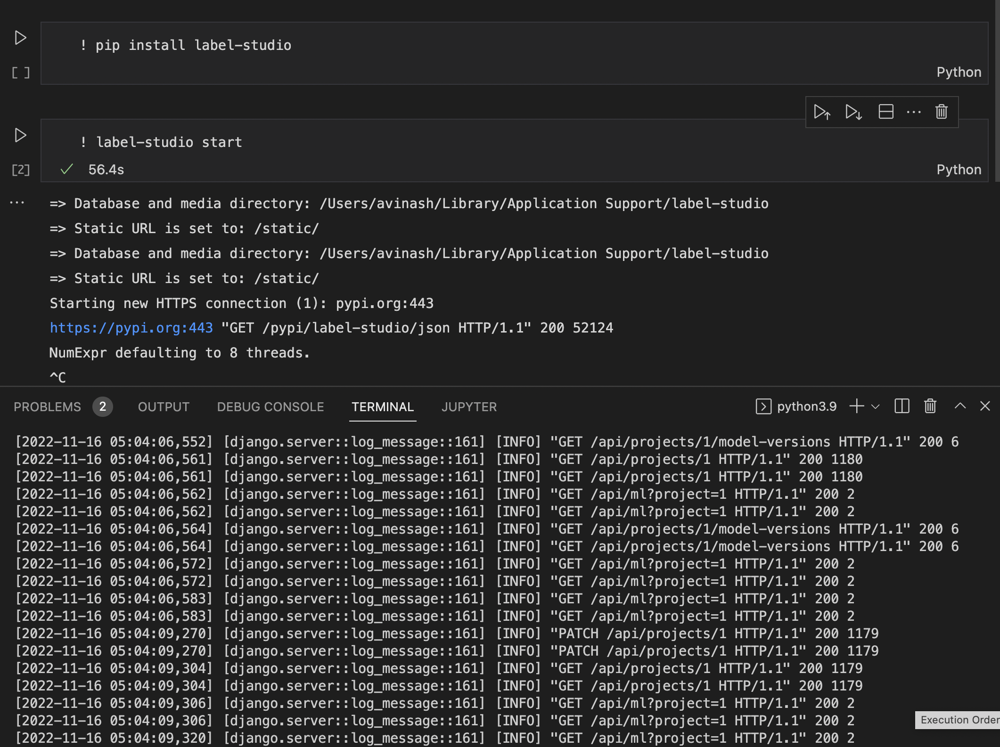

***Perform Labelling for Chess Dataset***

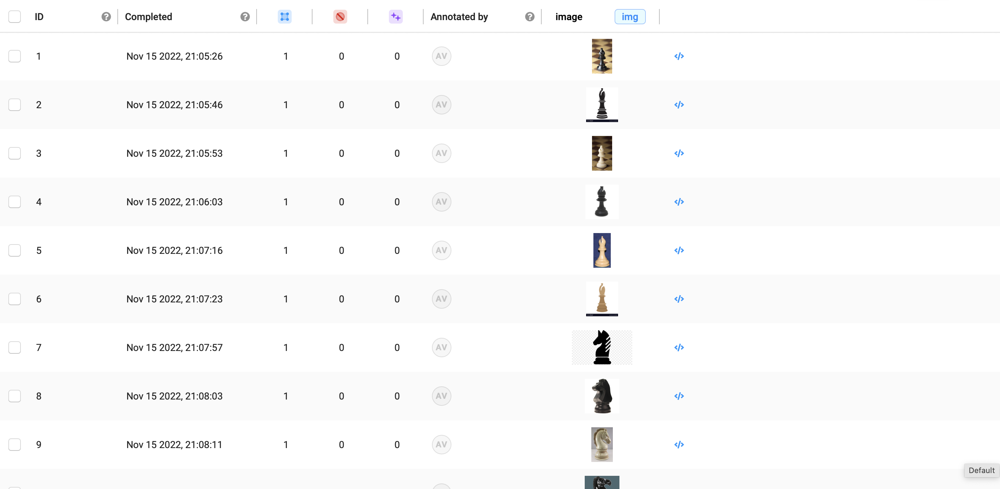

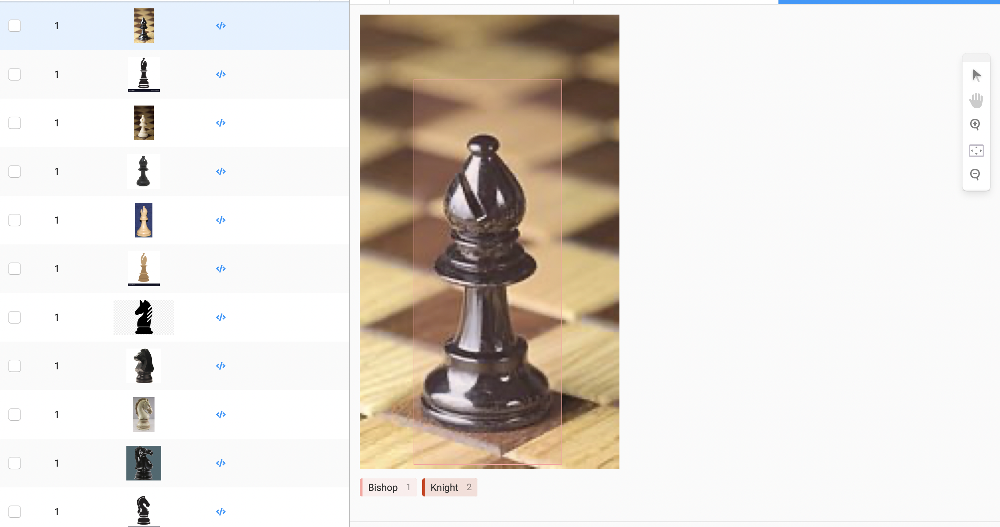

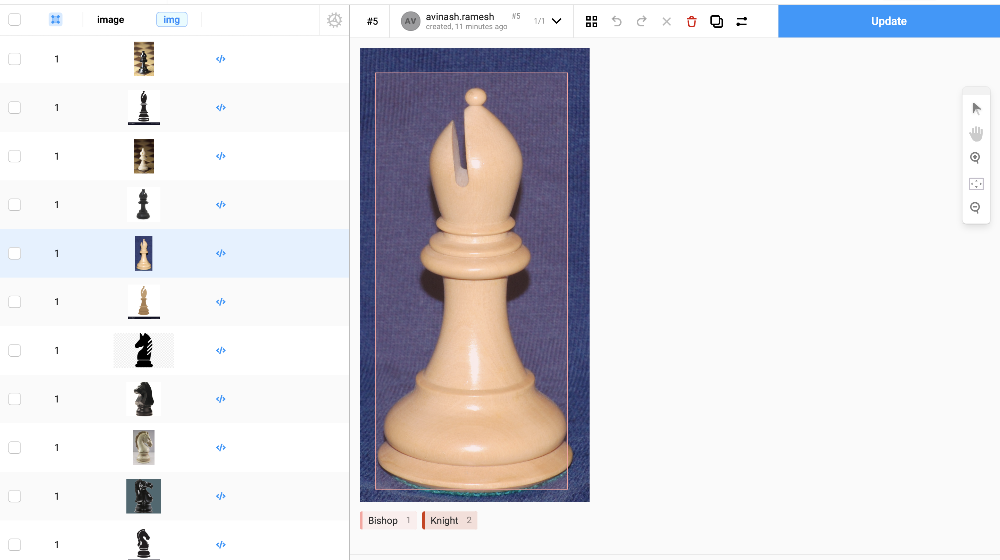

***Upload Config and Training Data to Colab***

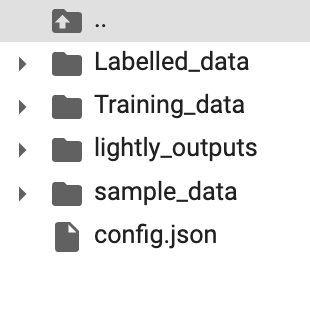

***Install Lightly***

In [ ]:
!pip install lightly

***Create a new Dataset and Upload Training Data to Lightly***

In [ ]:
!lightly-magic token='0496e4756268346002a999825678f0be22e29c8145447c50' dataset_id='637478da96ba509f0cd0aa4f' input_dir='/content/Training_data' trainer.max_epochs=0

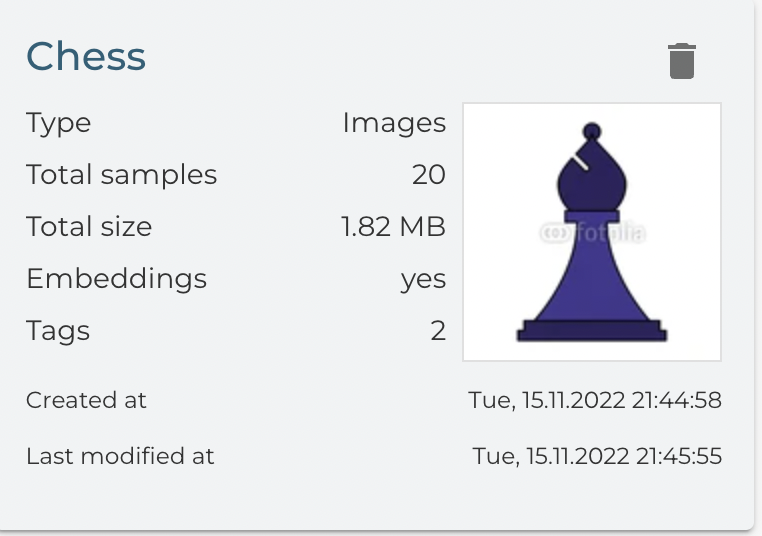

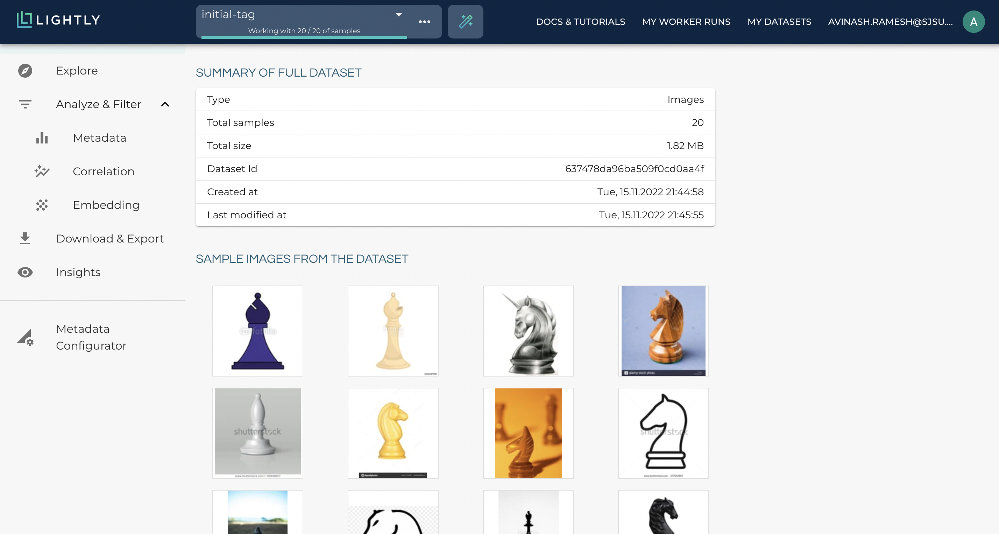

In [ ]:
import torch
from torchvision import datasets, io, models, ops, transforms, utils

In [ ]:
import json
from typing import Dict, Tuple, List

def read_label_element(label_element: Dict) -> Tuple[str, str]:
    filepath = "/" + label_element["data"]["image"].split("?d=")[-1]
    label = label_element["annotations"][0]["result"][0]["value"]["rectanglelabels"][0]
    return filepath, label

def read_LabelStudio_label_file(filepath: str) -> Tuple[List[str],List[str]]:
    # read the label file
    with open(filepath, 'r') as json_file:
        data = json.load(json_file)
    filepaths, labels = zip(* [read_label_element(label_element) for label_element in data])
    return filepaths, labels

In [ ]:
import os
import sys
from typing import List, Tuple, Union

import torch
import torchvision
from lightly.active_learning.scorers import ScorerClassification
from PIL import Image
from torch import nn, optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms as T
from tqdm import tqdm


class TorchImageDataset(Dataset):
    def __init__(
        self,
        image_paths: List[str],
        label_names: List[str],
        transform: object = None,
        labels: List[str] = None,
    ):
        """
        :param image_paths:
            one path for each image
        :param label_names:
            an ordered list of possible labels
        :param transform:
        :param labels:
            one label for each image. Each label must be in the label_names.
        """
        if transform is None:
            transform = T.Compose(
                [
                    T.Resize((360, 117)),
                    T.ToTensor(),
                    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                ]
            )
        self.transform = transform
        self.image_paths = image_paths
        self.labels = labels

        self.label_names = label_names
        self.label_name_to_index = {name: i for i, name in enumerate(label_names)}

    def __getitem__(self, index: int) -> Union[Tuple[torch.Tensor, int], torch.Tensor]:
        image_path = self.image_paths[index]
        image_pil = Image.open(image_path).convert("RGB")
        image_torch = self.transform(image_pil)
        if self.labels:
            return image_torch, self.label_name_to_index[self.labels[index]]
        else:
            return image_torch

    def __len__(self):
        return len(self.image_paths)


class ClassificationModel:
    def __init__(
        self, 
        num_classes: int = 3, 
        no_epochs: int = 5, 
        num_workers: int = None,
        batch_size: int = 1,
        **kwargs,
    ):
        # don't forget to initialize base class...
        self.model = torchvision.models.resnet18(
            pretrained=False, progress=True, num_classes=num_classes
        )
        device = "cuda" if torch.cuda.is_available() else "cpu"
        self.device = torch.device(device)
        self.model.to(self.device)
        self.no_epochs = no_epochs
        self.model_is_trained = False
        self.num_workers = num_workers or min(8, os.cpu_count())
        self.batch_size = batch_size

    def save_on_disk(self, model_path: str = "./classifier.pth"):
        to_save = {"model": self.model.to("cpu"), "label_names": self.label_names}
        torch.save(to_save, model_path)

    def load_from_disk(self, model_path: str = "./classifier.pth"):
        saved_data = torch.load(model_path)
        self.label_names = saved_data["label_names"]
        self.model = saved_data["model"].to(self.device)
        self.model_is_trained = True

    def fit(
        self,
        image_paths: List[str],
        image_labels: List[str],
        label_names: List[str] = None,
    ):
        print("STARTING FITTING")
        if label_names is None:
            self.label_names = sorted(list(set(image_labels)))

        dataset = TorchImageDataset(
            image_paths=image_paths, label_names=self.label_names, labels=image_labels
        )
        
        dataloader = torch.utils.data.DataLoader(
            dataset, 
            batch_size=self.batch_size, 
            shuffle=True, 
            num_workers=self.num_workers,
        )
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.SGD(self.model.parameters(), lr=0.001, momentum=0.9)
        self.model.train()
        pbar = tqdm(range(self.no_epochs), file=sys.stdout)
        for epoch in pbar:  # loop over the dataset multiple times
            running_loss = 0.0
            total_samples = 0
            correct = 0
            for data in dataloader:
                # get the inputs; data is a list of [inputs, labels]
                inputs, labels = data
                inputs = inputs.to(self.device)
                labels = labels.to(self.device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward + backward + optimize
                outputs = self.model(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                # print statistics
                running_loss += loss.item() * labels.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_samples += labels.size(0)
                correct += (predicted == labels).sum().item()
            text = f"epoch: {epoch} loss: {running_loss / total_samples:.6f} accuracy: {correct/total_samples:.3f}"
            tqdm.write(text)

        self.model_is_trained = True
        print("FINISHED FITTING")

    def predict(self, image_paths: List[str]) -> Tuple[List[str], ScorerClassification]:
        print("STARTING PREDICTION")

        if not self.model_is_trained:
            raise ValueError

        dataset = TorchImageDataset(image_paths, self.label_names)

        dataloader = DataLoader(
            dataset, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers,
        )
        predictions = []
        self.model.eval()
        with torch.no_grad():
            for x in tqdm(dataloader):
                pred = self.model(x.to(self.device)).cpu()
                predictions.append(pred)

        print("PUTTING TOGETHER RETURN VALUES")

        # flatten over batches
        predictions = [i for sublist in predictions for i in sublist]
        predictions = torch.stack(predictions, dim=0)
        predictions = torch.nn.functional.softmax(predictions, dim=1)

        predicted_classes_int = torch.argmax(predictions, dim=1)
        predicted_classes_str = [self.label_names[i] for i in predicted_classes_int]
        scorer = ScorerClassification(predictions)

        print("FINISHED PREDICTION")

        return predicted_classes_str, scorer

In [ ]:
import os

from lightly.active_learning.agents import ActiveLearningAgent
from lightly.active_learning.config import SelectionConfig
from lightly.api import ApiWorkflowClient
from lightly.data import LightlyDataset
from lightly.openapi_generated.swagger_client import SamplingMethod

if __name__ == "__main__":
    path_full_dataset = "/content/Training_data" ## UPDATE THIS PATH

    # 1. Prepare the active learning agent to make sure that your credentials are correct
    lighty_webapp_token = "0496e4756268346002a999825678f0be22e29c8145447c50"
    lighty_webapp_dataset_id = "637478da96ba509f0cd0aa4f"
    api_workflow_client = ApiWorkflowClient(token=lighty_webapp_token, dataset_id=lighty_webapp_dataset_id)
    al_agent = ActiveLearningAgent(api_workflow_client=api_workflow_client)

    # 2. read the label file
    filepaths, labels = read_LabelStudio_label_file("/content/config.json") ##UPDATE THIS PATH

    # 3. Define the image classification model
    classifier = ClassificationModel(no_epochs=20)

    # 4. Fit the classifier on the labeled images
    classifier.fit(image_paths=filepaths, image_labels=labels)

    # 5. Predict with the classifier on the complete dataset
    image_filenames_full_dataset = LightlyDataset(path_full_dataset).get_filenames()
    image_paths_full_dataset = [os.path.join(path_full_dataset, filename) for filename in image_filenames_full_dataset]
    predicted_classes_str, scorer = classifier.predict(image_paths=image_paths_full_dataset)

    # 6. Use the active learning sampler "CORAL" via the Lightly API to sample until we have 45 samples
    sampler_config = SelectionConfig(method=SamplingMethod.CORAL, n_samples=45, name="ASSIGNMENT_SpecialTopic")
    al_agent.query(sampler_config, al_scorer=scorer)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


STARTING FITTING
epoch: 0 loss: 1.067795 accuracy: 0.364
epoch: 1 loss: 0.978822 accuracy: 0.455
epoch: 2 loss: 1.016602 accuracy: 0.364
epoch: 3 loss: 0.678928 accuracy: 0.636
epoch: 4 loss: 0.919004 accuracy: 0.455
epoch: 5 loss: 0.816198 accuracy: 0.636
epoch: 6 loss: 0.721010 accuracy: 0.545
epoch: 7 loss: 1.010026 accuracy: 0.636
epoch: 8 loss: 1.497730 accuracy: 0.455
epoch: 9 loss: 1.235982 accuracy: 0.636
epoch: 10 loss: 0.715909 accuracy: 0.455
epoch: 11 loss: 0.960624 accuracy: 0.182
epoch: 12 loss: 0.841006 accuracy: 0.545
epoch: 13 loss: 0.894539 accuracy: 0.455
epoch: 14 loss: 0.752098 accuracy: 0.364
epoch: 15 loss: 0.635303 accuracy: 0.818
epoch: 16 loss: 0.660676 accuracy: 0.636
epoch: 17 loss: 0.581654 accuracy: 0.636
epoch: 18 loss: 0.726547 accuracy: 0.727
epoch: 19 loss: 0.474025 accuracy: 0.818
100%|██████████| 20/20 [01:19<00:00,  3.96s/it]
FINISHED FITTING
STARTING PREDICTION


100%|██████████| 20/20 [00:02<00:00,  8.88it/s]


PUTTING TOGETHER RETURN VALUES
FINISHED PREDICTION
